In [1]:
# Inital Setup

In [16]:
# Install OpenCV, pdf2image, poppler (for pdf to image), and pycocotools (MS COCO APIs)
# pip install opencv-python-headless
# pip install pdf2image
# pip install poppler-utils
# pip install pycocotools
# apt-get install tesseract-ocr

Retrieving notices: ...working... done
Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: \ 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::opencv==3.3.1=py36h9248ab4_2
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::pyparsing==2.2.0=py36hee85983_1
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::kiwisolver==1.0.1=py36h764f252_0
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::tqdm==4.23.0=py36_0
  - defaults/linux-64::urllib3==1.25.7=py36_0
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::python==3.10.9=h7a1cb2a_2
  - https://repo.continuum.io/pkgs/main/linux-64/linux-64::pyqt==5.9.2=py36h751905a_0
  - pytorch/linux-64::pytorch==2.1.0=py3.10_cuda12.1_cudnn8.9.2_0
  - defaults/linux-64::certifi==2021.5.30=py310h06a4308_0
  - https://repo.continuum.io/pkg

In [30]:
# Imports
import zipfile
import os
from PIL import Image 
from pathlib import Path 
import shutil 
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pdf2image

ModuleNotFoundError: No module named 'pytesseract'

In [13]:
# Checking versions (in case of dependency change)
# My system has conda 23.1.0 and python 3.10.9
!conda --version
!python --version

conda 23.1.0
Python 3.10.9


In [19]:
# If you haven't already- extract any zip files (DeepRule, CornerNet, Scientific PDFs, etc.)
# zip_file = "/workspace/Documents/scientific_pdfs.zip"
# extract_to = "/workspace/Documents/scientific_pdfs"

# with zipfile.ZipFile(zip_file, 'r') as zip_ref:
#     zip_ref.extractall(extract_to)

In [14]:
# Path to Scientific PDFS
# Customizable based on User input

#path = '/workspace/Documents/{your pdfs}'
path = '/workspace/Documents/scientific_pdfs/scientific_pdfs'

In [15]:
# Listing PDF files in folder
files = [f for f in os.listdir(path) if f.endswith('.pdf')]
print("PDF files:", files)

# If path is correct, names of 13 PDFS should display (for scientific_pdfs)

PDF files: ['19161491.pdf', '20601430.pdf', 'nature11524.pdf', '20595258.pdf', '20006622.pdf', '26525112.pdf', '31710151.pdf', '11386378.pdf', '27965450.pdf', 'biochemj00498-0024.pdf', 'biochemj00515-0110.pdf', '12381735.pdf', '12775706.pdf']


In [16]:
# Inputting a specific PDF for chart/graph extraction
# Users can select whatever pdf they would like, I will be using one of the 13
# 20601430.pdf (A Glucose Transporter Can Mediate Ribose Uptake)
# Make sure all of these folders exist

pdf_path = '/workspace/Documents/scientific_pdfs/scientific_pdfs/20601430.pdf'

# Create folders for page with bounding box detections and for cropped images
detected_path = "/content/drive/MyDrive/SCOPE/detections"
cropped_path = "/content/drive/MyDrive/SCOPE/cropped"

In [17]:
# Convert PDFs to images

output_path = "/workspace/Documents/outputs"

No charts detected in 20601430_page_1.png, skipping.


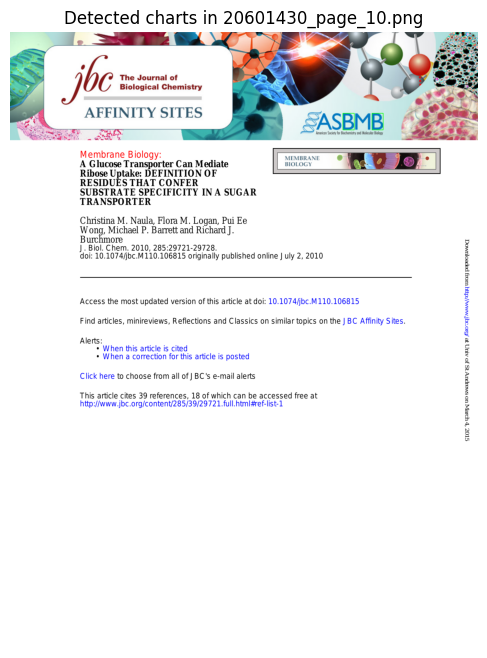

No charts detected in 20601430_page_9.png, skipping.


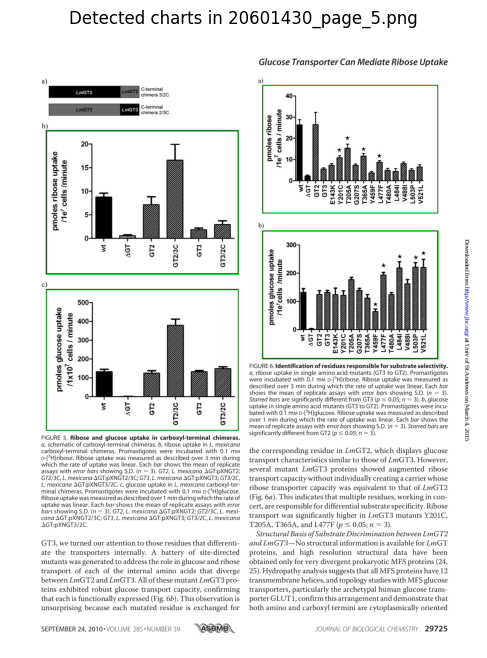

No charts detected in 20601430_page_7.png, skipping.
No charts detected in 20601430_page_3.png, skipping.


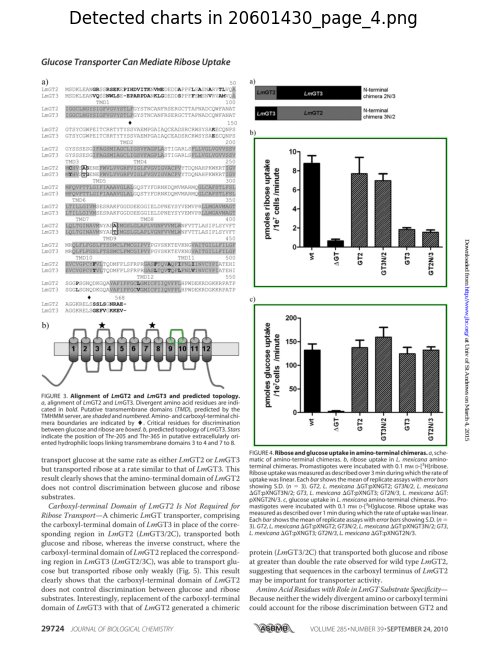

No charts detected in 20601430_page_2.png, skipping.


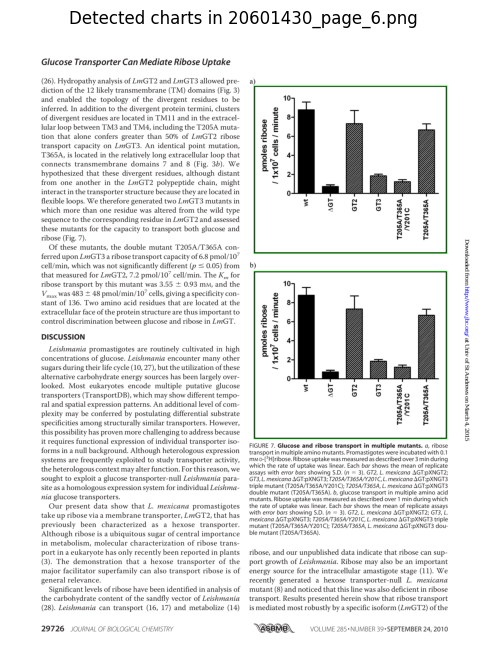

No charts detected in 20601430_page_8.png, skipping.


In [11]:
# More Details about the code below in the ReadMe file

for img_path in Path(output_path).glob("*.png"):
    #reads image file and loads it into OpenCV compatible format (multidimentional array)
    img = cv2.imread(str(img_path))
    #converts color image to grayscale (reducing to one intensity channel (brightness))
    #this simplifies processing
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #converts grayscale image to binary (black&white) based on calculated threshold
    #gray_img: image
    #255: max val assigned to pixels (that meet threshold condition)
    #cv2.ADAPTIVE_THRESH_GAUSSIAN_C: sets the method to gaussian, each pixel threshold
    #is computed based on nearby pixels
    #cv2.THRESH_BINARY_INV: inverts binary image, setting pizels to below
    #threshold 255 (white) and above 0 (black)
    # 11 + 2: 11 is the block size or area of neighboring pixels
    # 2 is a constant subtracted from mean to fine-tune the threshold
    thresh_img = cv2.adaptiveThreshold(
        gray_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
    )

    #canny edge detection
    #cv2.Canny: detects edges in binary image using canny algorithm
    #100 + 200: the lower and upper thresholds for edge detection
    #pixels with gradients about 200 are edges and below 100 is ignored
    edge_img = cv2.Canny(thresh_img, 100, 200)

    #finding contours
    #cv2.findContours: finds contours (outlines of shapes) in image
    #cv2.RETR_EXTERNAL: retrieves only outer contours (we ignored nested)
    #cv2.CHAIN_APPROX_SIMPLE: simplifies the contours to reduce points and storage
    #cnts: stores list of detected contours as array of points
    cnts, _ = cv2.findContours(edge_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #track detections and initialize counter for the cropped images
    found_chart = False
    chart_count = 0

    #filter contours (using our five techniques)
    #loops over each detected contour in cnts
    #cv2.contourArea(c): calculates the area of contour c.
    #cv2.arcLength(c, True): calculates perimeter of contour c (True = contour is closed)
    for c in cnts:
        area = cv2.contourArea(c)
        perimeter = cv2.arcLength(c, True)

        #1: min area threshold (might can adjust based on image size)
        if area < 2000:
            continue

        #bounding boxes
        #cv2.boundingRect(c): creates bounding rect. for contour c
        #returns the top-left corner coordinates (x,y) and width and height
        #(for further checks)
        x, y, w, h = cv2.boundingRect(c)

        #2: aspect ratio check (non-rectangular objects)
        #filters out contours that are too narrow or tall
        aspect_ratio = w / float(h)
        if not (0.5 < aspect_ratio < 2.5):  #can be adjust based on chart dimensions
            continue

        #3: circularity check (filter circular/small shapes)
        #circularity: 4 * (pi) * area/(perimeter^2)
        #circularity close to 1 is circular
        circularity = 4 * 3.14159 * (area / (perimeter * perimeter)) if perimeter != 0 else 0
        if circularity > 0.8:
            continue

        #4: density (filter thin or sparse contours)
        #density: area / (w * h) where lower density is thin or sparse
        density = area / (w * h)
        if density < 0.4:
            continue

        #5: shape (convex hull comparison)
        #cv2.convexHull(c): calculates convex hull of contour c,
        #this is the smaller convex shape that encloses it
        #solidity: area / hull_area where lower values are irregular
        hull = cv2.convexHull(c)
        hull_area = cv2.contourArea(hull)
        solidity = area / hull_area if hull_area != 0 else 0
        if solidity < 0.7:
            continue

        #if all checks are passed
        found_chart = True

        #cv2.rectangle() draws a green rect around chart area
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

        #crop region and save
        #extracts chart region using bounding box coords (x,y,w,h)
        cropped_img = img[y:y+h, x:x+w]
        crop_path = Path(cropped_path) / f"{img_path.stem}_chart_{chart_count}.png"
        cv2.imwrite(str(crop_path), cropped_img)
        chart_count += 1

    #save and display (just to visualize without going into folder)
    if found_chart:
        anno_path = Path(detected_path) / f"annotated_{img_path.name}"
        cv2.imwrite(str(anno_path), img)

        #display
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detected charts in {img_path.name}")
        plt.axis("off")
        plt.show()
    else:
        print(f"No charts detected in {img_path.name}, skipping.")


Processing 20601430_page_1.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_1_figure.png


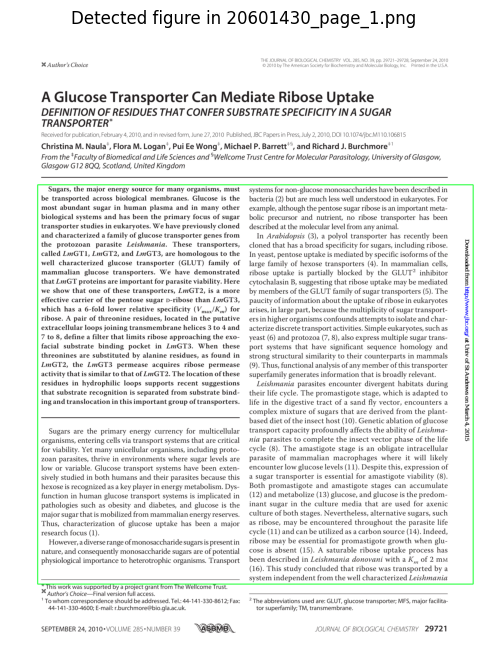

Processing 20601430_page_10.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_10_figure.png


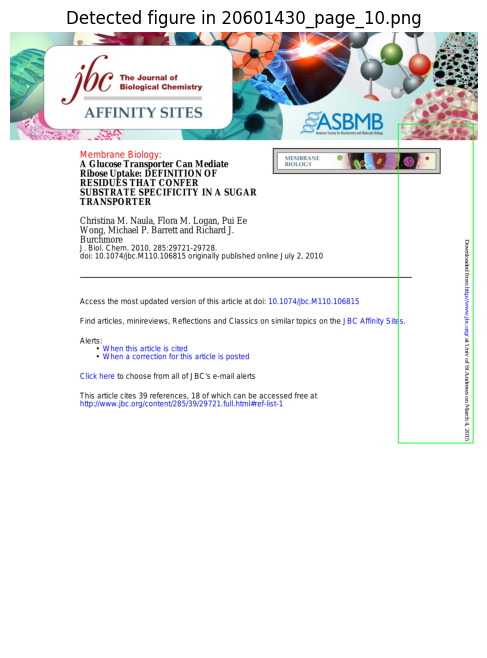

Processing 20601430_page_9.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_9_figure.png


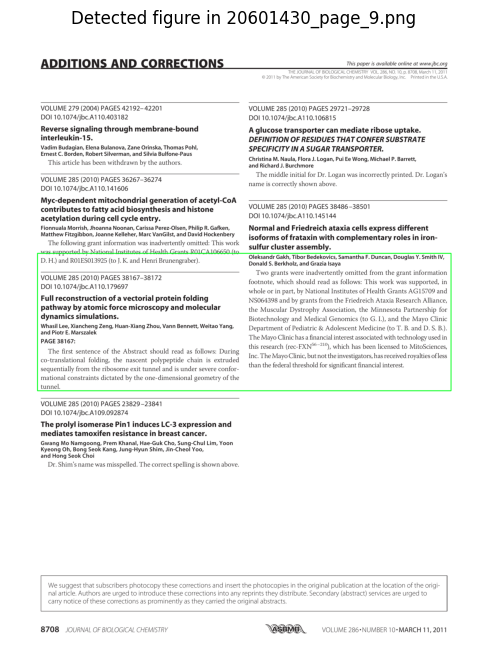

Processing 20601430_page_5.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_5_figure.png


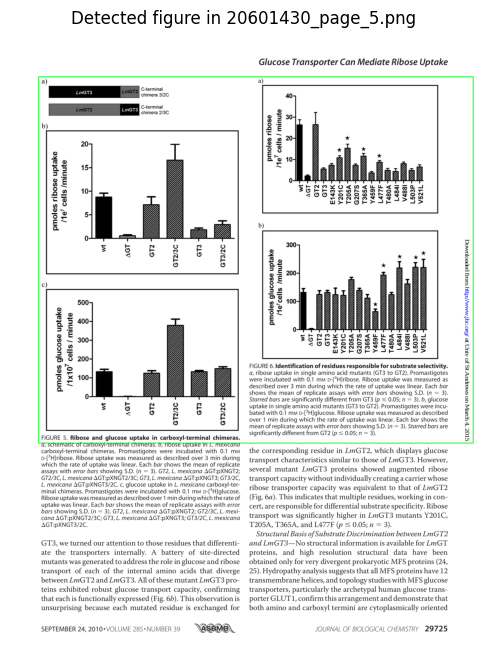

Processing 20601430_page_7.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_7_figure.png


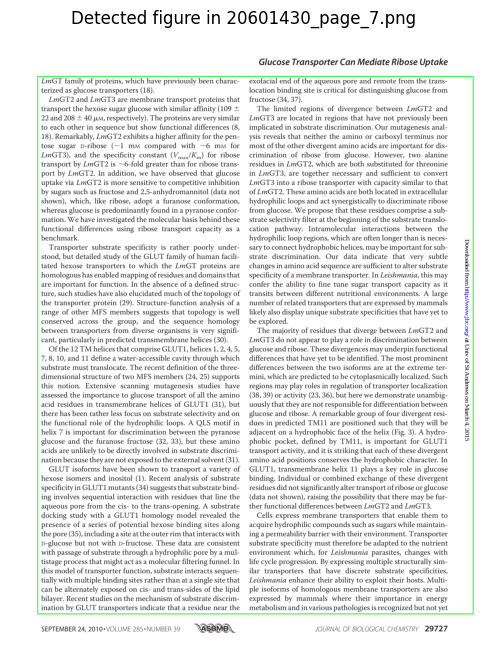

Processing 20601430_page_3.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_3_figure.png


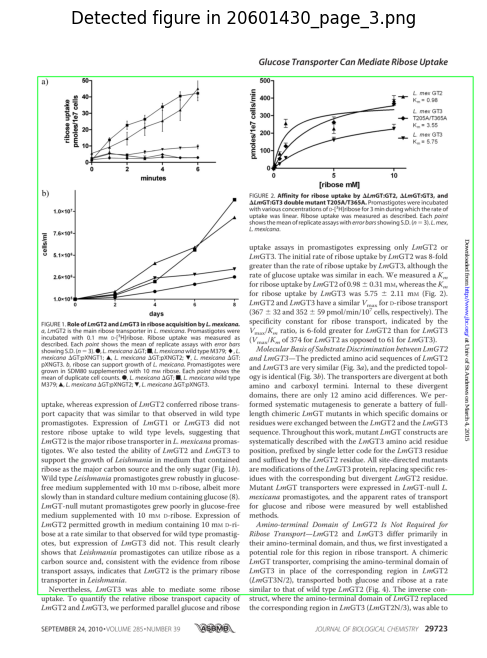

Processing 20601430_page_4.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_4_figure.png


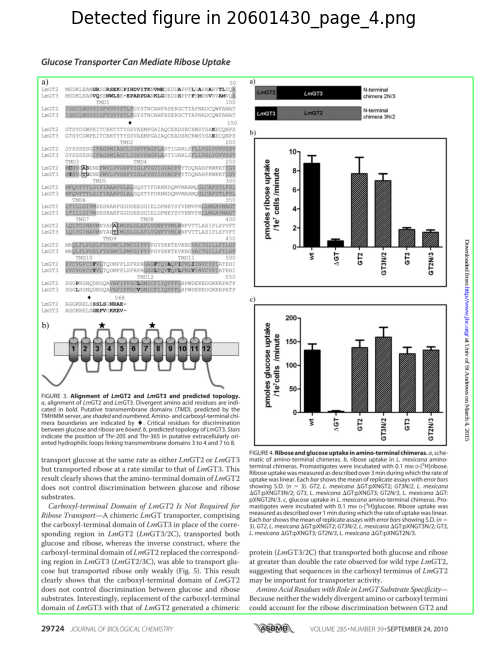

Processing 20601430_page_2.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_2_figure.png


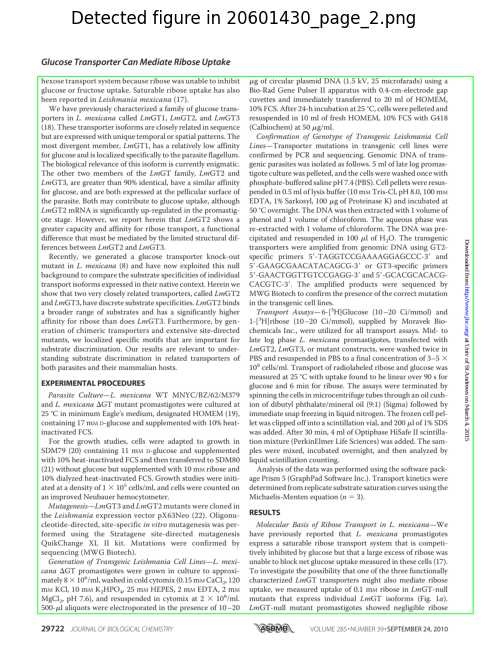

Processing 20601430_page_6.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_6_figure.png


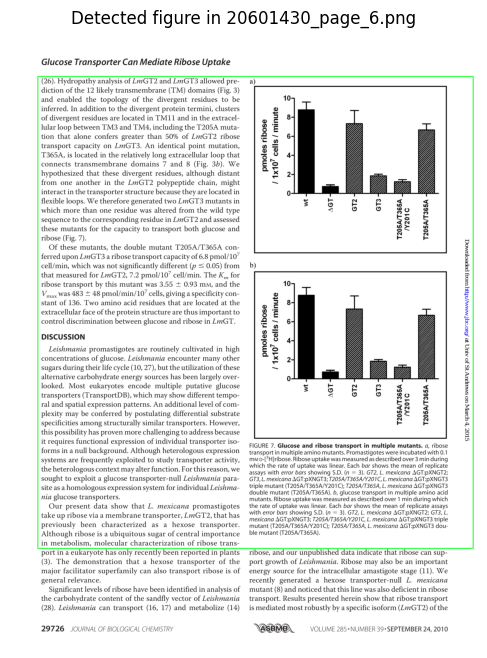

Processing 20601430_page_8.png...
Saved extracted figure to /workspace/Documents/extracted_figures/20601430_page_8_figure.png


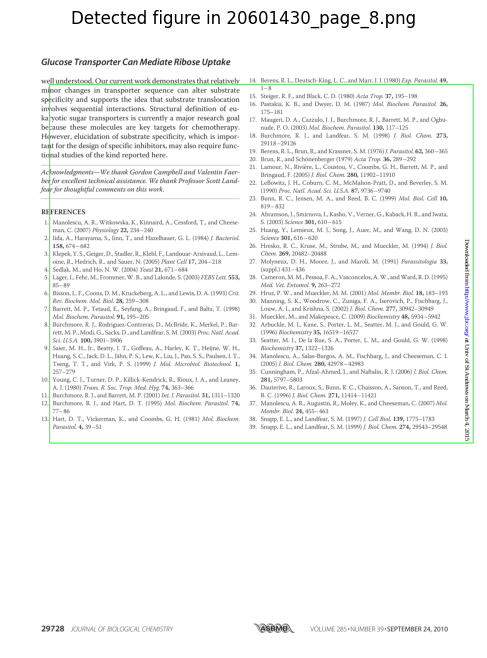

In [20]:
# Define paths
input_path = "/workspace/Documents/outputs"  # Directory containing images
output_path = "/workspace/Documents/extracted_figures"  # Directory to save extracted diagrams

# Loop through images in the input directory
for img_path in Path(input_path).glob("*.png"):
    print(f"Processing {img_path.name}...")
    
    # Load image, convert to grayscale, and apply Otsu's threshold
    img = cv2.imread(str(img_path))
    original = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    
    # Dilate to connect text contours into single contours
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 10))
    dilate = cv2.dilate(thresh, kernel, iterations=2)
    
    # Find and remove non-diagram contours
    contours = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]
    for c in contours:
        x, y, w, h = cv2.boundingRect(c)
        area = cv2.contourArea(c)
        # Filter non-diagram contours based on aspect ratio and area
        if w / h > 2 and area > 10000:
            cv2.drawContours(dilate, [c], -1, (0, 0, 0), -1)
    
    # Detect remaining contours and determine bounding boxes
    diagram_boxes = []
    contours = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]
    for c in contours:
        x, y, w, h = cv2.boundingRect(c)
        diagram_boxes.append([x, y, x + w, y + h])
    
    # Form a single bounding box around all diagram contours
    if diagram_boxes:
        diagram_boxes = np.asarray(diagram_boxes)
        x = np.min(diagram_boxes[:, 0])
        y = np.min(diagram_boxes[:, 1])
        w = np.max(diagram_boxes[:, 2]) - x
        h = np.max(diagram_boxes[:, 3]) - y
        
        # Draw bounding box on the original image
        cv2.rectangle(img, (x, y), (x + w, y + h), (36, 255, 12), 3)
        
        # Extract the region of interest (ROI)
        ROI = original[y:y+h, x:x+w]
        
        # Save the extracted figure
        output_file = Path(output_path) / f"{img_path.stem}_figure.png"
        cv2.imwrite(str(output_file), ROI)
        print(f"Saved extracted figure to {output_file}")
        
        # Display the results
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detected figure in {img_path.name}")
        plt.axis("off")
        plt.show()
    else:
        print(f"No diagrams detected in {img_path.name}, skipping.")


Processing 20601430_page_1.png...
Saved chart 1 from 20601430_page_1.png to /workspace/Documents/extracted_figures_3/20601430_page_1_chart_0.png
Saved chart 2 from 20601430_page_1.png to /workspace/Documents/extracted_figures_3/20601430_page_1_chart_1.png
Saved chart 3 from 20601430_page_1.png to /workspace/Documents/extracted_figures_3/20601430_page_1_chart_2.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_1.png


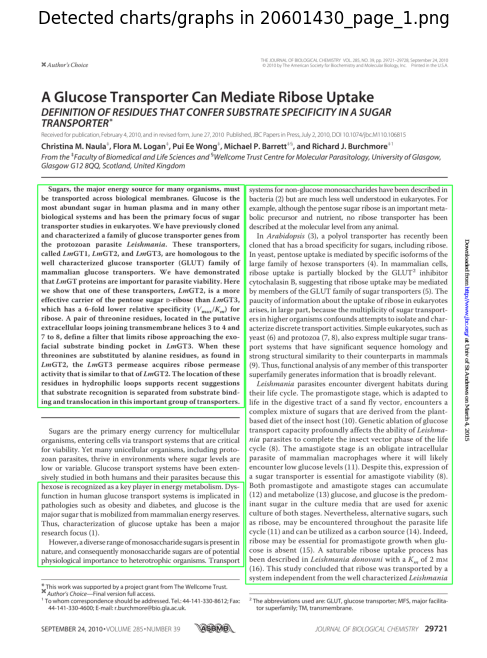

Processing 20601430_page_10.png...
Saved chart 1 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_0.png
Saved chart 2 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_1.png
Saved chart 3 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_2.png
Saved chart 4 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_3.png
Saved chart 5 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_4.png
Saved chart 6 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_5.png
Saved chart 7 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_6.png
Saved chart 8 from 20601430_page_10.png to /workspace/Documents/extracted_figures_3/20601430_page_10_chart_7.png
Saved chart 9 from 20601430_page_10.png to /workspace/Documen

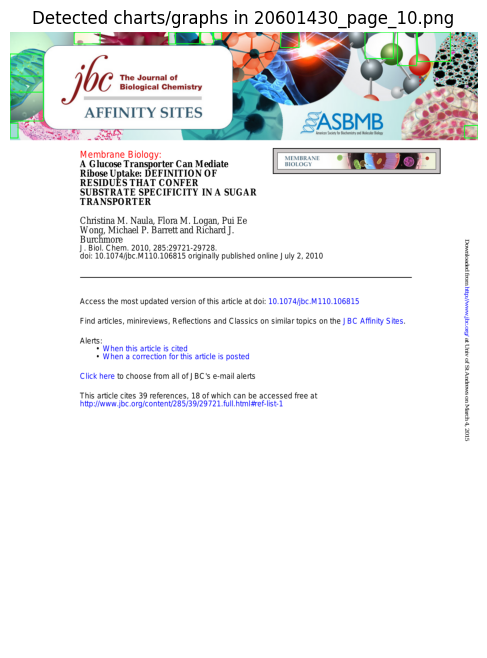

Processing 20601430_page_9.png...
Saved chart 1 from 20601430_page_9.png to /workspace/Documents/extracted_figures_3/20601430_page_9_chart_0.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_9.png


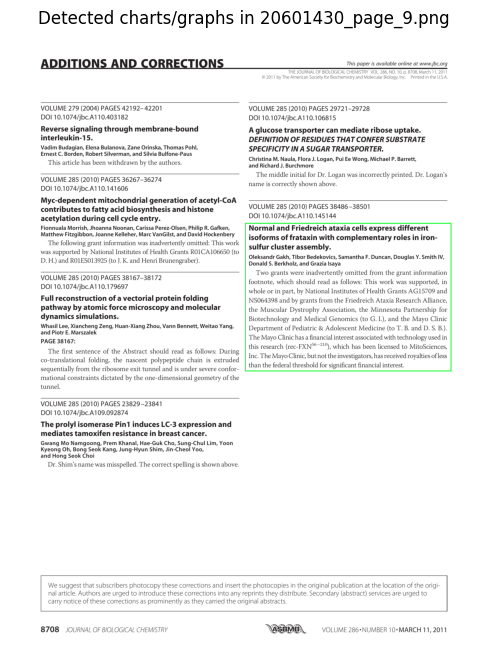

Processing 20601430_page_5.png...
Saved chart 1 from 20601430_page_5.png to /workspace/Documents/extracted_figures_3/20601430_page_5_chart_0.png
Saved chart 2 from 20601430_page_5.png to /workspace/Documents/extracted_figures_3/20601430_page_5_chart_1.png
Saved chart 3 from 20601430_page_5.png to /workspace/Documents/extracted_figures_3/20601430_page_5_chart_2.png
Saved chart 4 from 20601430_page_5.png to /workspace/Documents/extracted_figures_3/20601430_page_5_chart_3.png
Saved chart 5 from 20601430_page_5.png to /workspace/Documents/extracted_figures_3/20601430_page_5_chart_4.png
Saved chart 6 from 20601430_page_5.png to /workspace/Documents/extracted_figures_3/20601430_page_5_chart_5.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_5.png


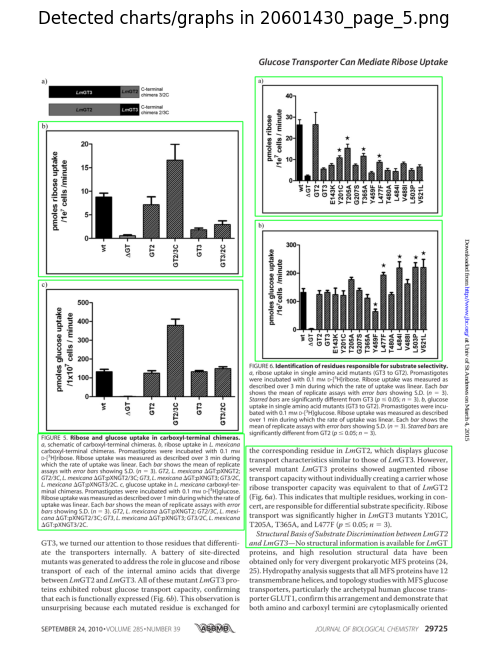

Processing 20601430_page_7.png...
Saved chart 1 from 20601430_page_7.png to /workspace/Documents/extracted_figures_3/20601430_page_7_chart_0.png
Saved chart 2 from 20601430_page_7.png to /workspace/Documents/extracted_figures_3/20601430_page_7_chart_1.png
Saved chart 3 from 20601430_page_7.png to /workspace/Documents/extracted_figures_3/20601430_page_7_chart_2.png
Saved chart 4 from 20601430_page_7.png to /workspace/Documents/extracted_figures_3/20601430_page_7_chart_3.png
Saved chart 5 from 20601430_page_7.png to /workspace/Documents/extracted_figures_3/20601430_page_7_chart_4.png
Saved chart 6 from 20601430_page_7.png to /workspace/Documents/extracted_figures_3/20601430_page_7_chart_5.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_7.png


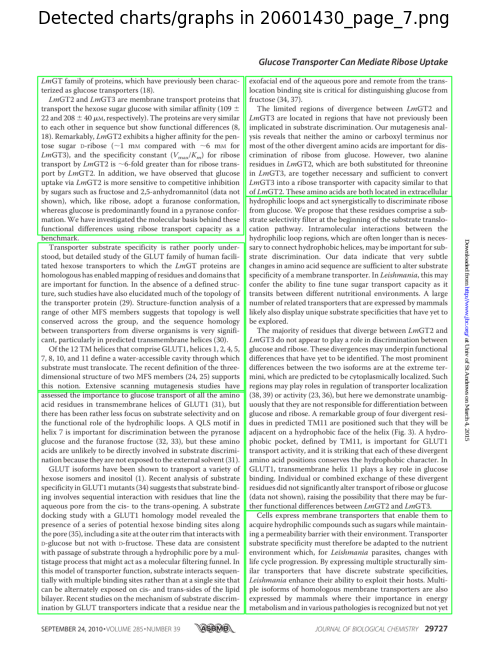

Processing 20601430_page_3.png...
Saved chart 1 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_0.png
Saved chart 2 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_1.png
Saved chart 3 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_2.png
Saved chart 4 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_3.png
Saved chart 5 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_4.png
Saved chart 6 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_5.png
Saved chart 7 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_6.png
Saved chart 8 from 20601430_page_3.png to /workspace/Documents/extracted_figures_3/20601430_page_3_chart_7.png
Saved chart 9 from 20601430_page_3.png to /workspace/Documents/extracted_figur

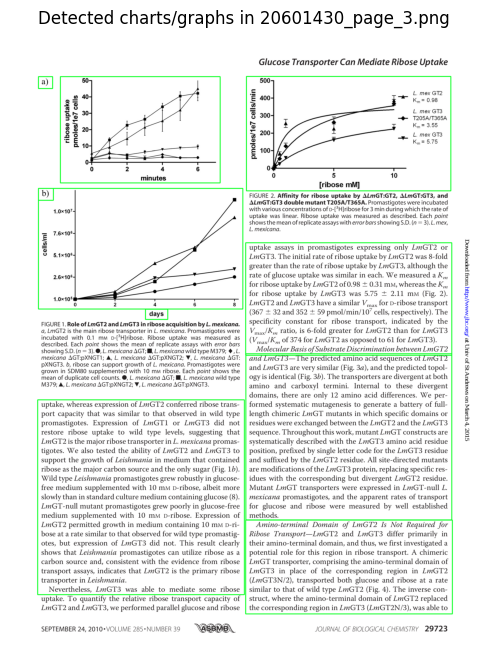

Processing 20601430_page_4.png...
Saved chart 1 from 20601430_page_4.png to /workspace/Documents/extracted_figures_3/20601430_page_4_chart_0.png
Saved chart 2 from 20601430_page_4.png to /workspace/Documents/extracted_figures_3/20601430_page_4_chart_1.png
Saved chart 3 from 20601430_page_4.png to /workspace/Documents/extracted_figures_3/20601430_page_4_chart_2.png
Saved chart 4 from 20601430_page_4.png to /workspace/Documents/extracted_figures_3/20601430_page_4_chart_3.png
Saved chart 5 from 20601430_page_4.png to /workspace/Documents/extracted_figures_3/20601430_page_4_chart_4.png
Saved chart 6 from 20601430_page_4.png to /workspace/Documents/extracted_figures_3/20601430_page_4_chart_5.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_4.png


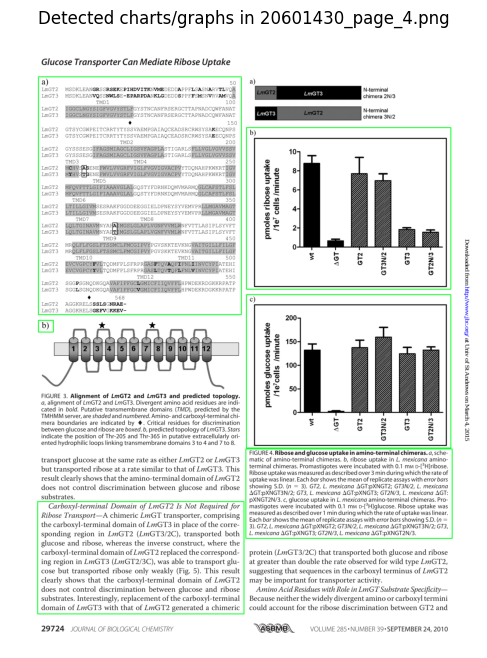

Processing 20601430_page_2.png...
Saved chart 1 from 20601430_page_2.png to /workspace/Documents/extracted_figures_3/20601430_page_2_chart_0.png
Saved chart 2 from 20601430_page_2.png to /workspace/Documents/extracted_figures_3/20601430_page_2_chart_1.png
Saved chart 3 from 20601430_page_2.png to /workspace/Documents/extracted_figures_3/20601430_page_2_chart_2.png
Saved chart 4 from 20601430_page_2.png to /workspace/Documents/extracted_figures_3/20601430_page_2_chart_3.png
Saved chart 5 from 20601430_page_2.png to /workspace/Documents/extracted_figures_3/20601430_page_2_chart_4.png
Saved chart 6 from 20601430_page_2.png to /workspace/Documents/extracted_figures_3/20601430_page_2_chart_5.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_2.png


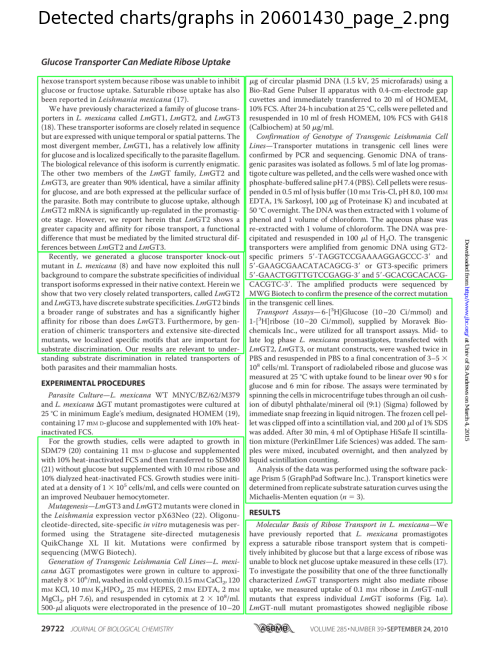

Processing 20601430_page_6.png...
Saved chart 1 from 20601430_page_6.png to /workspace/Documents/extracted_figures_3/20601430_page_6_chart_0.png
Saved chart 2 from 20601430_page_6.png to /workspace/Documents/extracted_figures_3/20601430_page_6_chart_1.png
Saved chart 3 from 20601430_page_6.png to /workspace/Documents/extracted_figures_3/20601430_page_6_chart_2.png
Saved chart 4 from 20601430_page_6.png to /workspace/Documents/extracted_figures_3/20601430_page_6_chart_3.png
Saved chart 5 from 20601430_page_6.png to /workspace/Documents/extracted_figures_3/20601430_page_6_chart_4.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_6.png


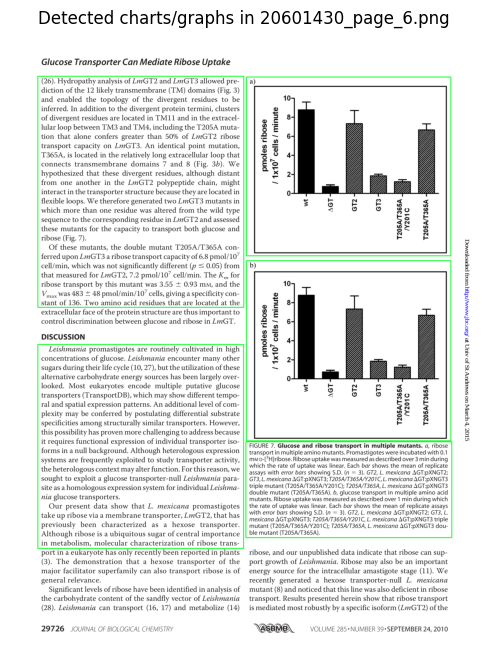

Processing 20601430_page_8.png...
Saved chart 1 from 20601430_page_8.png to /workspace/Documents/extracted_figures_3/20601430_page_8_chart_0.png
Saved chart 2 from 20601430_page_8.png to /workspace/Documents/extracted_figures_3/20601430_page_8_chart_1.png
Annotated image saved as /workspace/Documents/extracted_figures_3/annotated_20601430_page_8.png


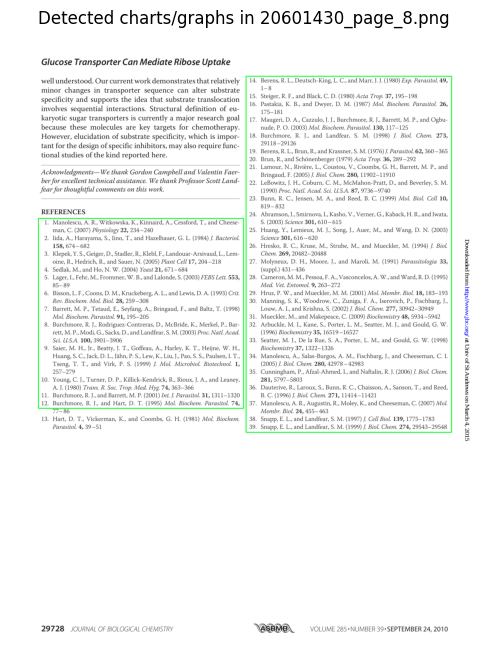

In [23]:
# Define paths
input_path = "/workspace/Documents/outputs"  # Directory containing images
output_path = "/workspace/Documents/extracted_figures_3"  # Directory to save extracted diagrams

# Ensure the output directory exists
os.makedirs(output_path, exist_ok=True)

# Loop through images in the input directory
for img_path in Path(input_path).glob("*.png"):
    print(f"Processing {img_path.name}...")
    
    # Load image and enhance contrast
    img = cv2.imread(str(img_path))
    original = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    enhanced = cv2.equalizeHist(gray)  # Enhance contrast for darker regions
    
    # Threshold the image using adaptive method
    thresh = cv2.adaptiveThreshold(
        enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
    )
    
    # Dilate to connect text contours into single contours
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 10))
    dilate = cv2.dilate(thresh, kernel, iterations=2)
    
    # Find and remove text-heavy regions
    text_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 15))
    text_dilate = cv2.dilate(thresh, text_kernel, iterations=1)
    cnts = cv2.findContours(text_dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        # Remove long, thin text regions
        if w / h > 4 or h / w > 4:
            cv2.drawContours(dilate, [c], -1, (0, 0, 0), -1)
    
    # Detect remaining contours and determine bounding boxes for each chart
    cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    chart_count = 0  # Counter for multiple charts/graphs
    
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        area = cv2.contourArea(c)
        aspect_ratio = w / float(h)
        
        # Filter out non-diagram regions
        if area > 1000 and 0.5 < aspect_ratio < 2.5:
            # Draw bounding box on the original image
            cv2.rectangle(img, (x, y), (x + w, y + h), (36, 255, 12), 3)
            
            # Extract the region of interest (ROI)
            ROI = original[y:y+h, x:x+w]
            
            # Save each individual chart/graph
            output_file = Path(output_path) / f"{img_path.stem}_chart_{chart_count}.png"
            cv2.imwrite(str(output_file), ROI)
            chart_count += 1
            print(f"Saved chart {chart_count} from {img_path.name} to {output_file}")
    
    # Save and display the annotated image showing all detected charts/graphs
    if chart_count > 0:
        annotated_file = Path(output_path) / f"annotated_{img_path.stem}.png"
        cv2.imwrite(str(annotated_file), img)
        print(f"Annotated image saved as {annotated_file}")
        
        # Display annotated image
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detected charts/graphs in {img_path.name}")
        plt.axis("off")
        plt.show()
    else:
        print(f"No charts/graphs detected in {img_path.name}, skipping.")


Processing 20601430_page_1.png...
No charts/graphs detected in 20601430_page_1.png, skipping.
Processing 20601430_page_10.png...
No charts/graphs detected in 20601430_page_10.png, skipping.
Processing 20601430_page_9.png...
No charts/graphs detected in 20601430_page_9.png, skipping.
Processing 20601430_page_5.png...
Saved chart 1 from 20601430_page_5.png to /workspace/Documents/extracted_figures_4/20601430_page_5_chart_0.png
Saved chart 2 from 20601430_page_5.png to /workspace/Documents/extracted_figures_4/20601430_page_5_chart_1.png
Saved chart 3 from 20601430_page_5.png to /workspace/Documents/extracted_figures_4/20601430_page_5_chart_2.png
Saved chart 4 from 20601430_page_5.png to /workspace/Documents/extracted_figures_4/20601430_page_5_chart_3.png
Annotated image saved as /workspace/Documents/extracted_figures_4/annotated_20601430_page_5.png


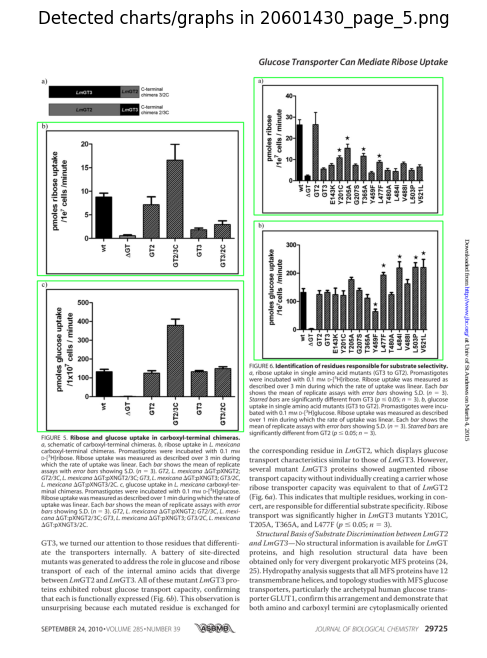

Processing 20601430_page_7.png...
No charts/graphs detected in 20601430_page_7.png, skipping.
Processing 20601430_page_3.png...
Saved chart 1 from 20601430_page_3.png to /workspace/Documents/extracted_figures_4/20601430_page_3_chart_0.png
Saved chart 2 from 20601430_page_3.png to /workspace/Documents/extracted_figures_4/20601430_page_3_chart_1.png
Saved chart 3 from 20601430_page_3.png to /workspace/Documents/extracted_figures_4/20601430_page_3_chart_2.png
Annotated image saved as /workspace/Documents/extracted_figures_4/annotated_20601430_page_3.png


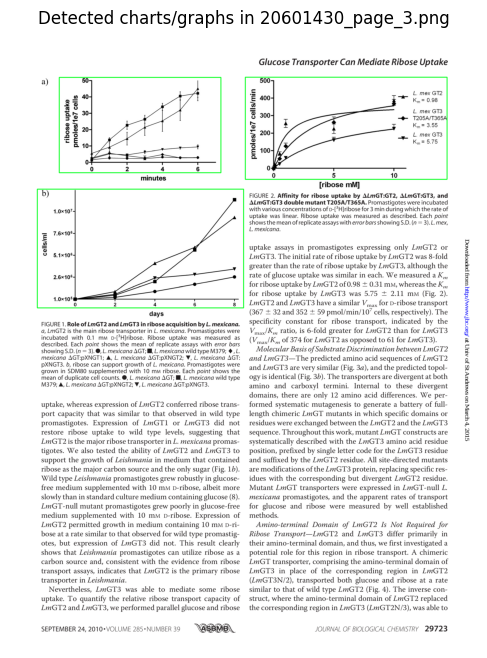

Processing 20601430_page_4.png...
Saved chart 1 from 20601430_page_4.png to /workspace/Documents/extracted_figures_4/20601430_page_4_chart_0.png
Saved chart 2 from 20601430_page_4.png to /workspace/Documents/extracted_figures_4/20601430_page_4_chart_1.png
Saved chart 3 from 20601430_page_4.png to /workspace/Documents/extracted_figures_4/20601430_page_4_chart_2.png
Annotated image saved as /workspace/Documents/extracted_figures_4/annotated_20601430_page_4.png


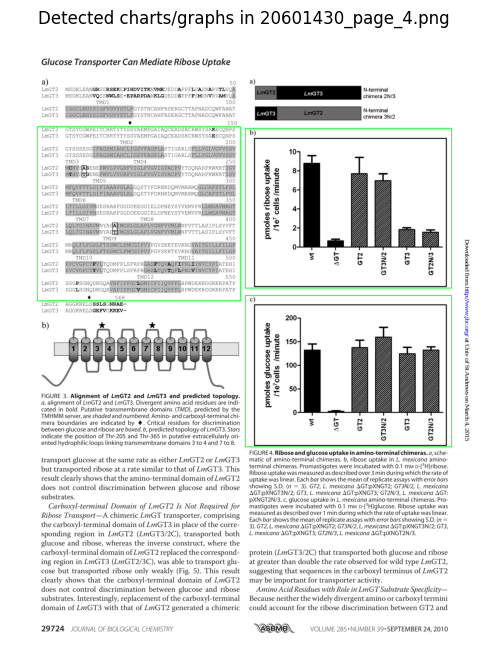

Processing 20601430_page_2.png...
No charts/graphs detected in 20601430_page_2.png, skipping.
Processing 20601430_page_6.png...
Saved chart 1 from 20601430_page_6.png to /workspace/Documents/extracted_figures_4/20601430_page_6_chart_0.png
Saved chart 2 from 20601430_page_6.png to /workspace/Documents/extracted_figures_4/20601430_page_6_chart_1.png
Annotated image saved as /workspace/Documents/extracted_figures_4/annotated_20601430_page_6.png


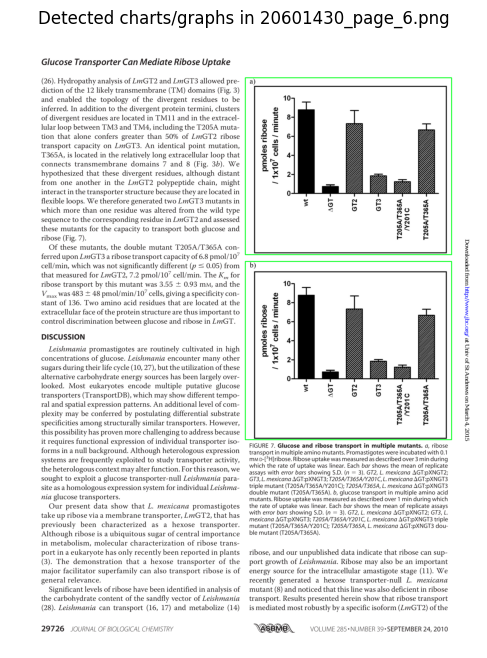

Processing 20601430_page_8.png...
No charts/graphs detected in 20601430_page_8.png, skipping.


In [92]:
# Define paths
input_path = "/workspace/Documents/outputs"  # Directory containing images
output_path = "/workspace/Documents/extracted_figures_4"  # Directory to save extracted diagrams

# Ensure the output directory exists
os.makedirs(output_path, exist_ok=True)

# Loop through images in the input directory
for img_path in Path(input_path).glob("*.png"):
    print(f"Processing {img_path.name}...")
    
    # Load image and enhance contrast
    img = cv2.imread(str(img_path))
    original = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    enhanced = cv2.equalizeHist(gray)  # Enhance contrast for darker regions
    
    # Threshold the image using adaptive method
    thresh = cv2.adaptiveThreshold(
        enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
    )
    
    # Dilate to connect text contours into single contours
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)
    
    # Find and remove text-heavy regions
    text_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 3))
    text_dilate = cv2.dilate(thresh, text_kernel, iterations=1)
    cnts = cv2.findContours(text_dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        area = cv2.contourArea(c)
        aspect_ratio = w / float(h)
        
        # Remove long, thin text regions
        if area < 500 or w < 10 or h < 10 or aspect_ratio > 5 or aspect_ratio < 0.2:
            cv2.drawContours(dilate, [c], -1, (0, 0, 0), -1)
    
    # Detect remaining contours and determine bounding boxes for each chart
    cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    chart_count = 0  # Counter for multiple charts/graphs
    
    for c in cnts:
        x, y, w, h = cv2.boundingRect(c)
        area = cv2.contourArea(c)
        aspect_ratio = w / float(h)
        
        # Filter out non-diagram regions
        if area > 8000 and 0.8 < aspect_ratio < 2:
            # Draw bounding box on the original image
            cv2.rectangle(img, (x, y), (x + w, y + h), (36, 255, 12), 3)
            
            # Extract the region of interest (ROI)
            ROI = original[y:y+h, x:x+w]
            
            # Save each individual chart/graph
            output_file = Path(output_path) / f"{img_path.stem}_chart_{chart_count}.png"
            cv2.imwrite(str(output_file), ROI)
            chart_count += 1
            print(f"Saved chart {chart_count} from {img_path.name} to {output_file}")
    
    # Save and display the annotated image showing all detected charts/graphs
    if chart_count > 0:
        annotated_file = Path(output_path) / f"annotated_{img_path.stem}.png"
        cv2.imwrite(str(annotated_file), img)
        print(f"Annotated image saved as {annotated_file}")
        
        # Display annotated image
        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detected charts/graphs in {img_path.name}")
        plt.axis("off")
        plt.show()
    else:
        print(f"No charts/graphs detected in {img_path.name}, skipping.")


In [86]:
# Now for ChartOCR Setup

In [9]:
# Creating conda environment based on DeepRule.txt dependencies
# Make sure ALL links are updated to your python and cuda versions
# conda create --name DeepRule --file /workspace/Documents/DeepRule-master/DeepRule-master/DeepRule.txt -y





Preparing transaction: done
Verifying transaction: done
Executing transaction: / 

    Installed package of scikit-learn can be accelerated using scikit-learn-intelex.
    More details are available here: https://intel.github.io/scikit-learn-intelex

    For example:

        $ conda install scikit-learn-intelex
        $ python -m sklearnex my_application.py

    

done


In [12]:
# Activating DeepRule environment
# conda activate DeepRule


CommandNotFoundError: Your shell has not been properly configured to use 'conda activate'.
To initialize your shell, run

    $ conda init <SHELL_NAME>

Currently supported shells are:
  - bash
  - fish
  - tcsh
  - xonsh
  - zsh
  - powershell

See 'conda init --help' for more information and options.

IMPORTANT: You may need to close and restart your shell after running 'conda init'.




In [23]:
# cd /workspace/Documents/CornerNet-master/CornerNet-master/models/py_utils/_cpools/

/workspace/Documents/CornerNet-master/CornerNet-master/models/py_utils/_cpools
